In [1]:
%run ../input/python-recipes/radial_gradient_header.py
%radial_gradient_header Code Modules & Helpful Functions

In [2]:
from IPython.display import display,HTML,clear_output,Image
import warnings; warnings.filterwarnings('ignore')
import tensorflow as tf,numpy as np,pylab as pl
import PIL.Image,time,imageio
file_path='https://olgabelitskaya.gitlab.io/images/'

In [3]:
def display_images(original_img,style_img,
                   file_path=file_path):    
    fig=pl.figure(figsize=(10,5))
    ax=fig.add_subplot(121)
    str1='Shape of the original image: %s'
    pl.title(str1%str(original_img.shape),fontsize=int(8))
    ax.imshow(np.squeeze(original_img))
    ax=fig.add_subplot(122)
    str2='Shape of the style image: %s'
    pl.title(str2%str(style_img.shape),fontsize=int(8))
    ax.imshow(np.squeeze(style_img))
    pl.tight_layout(); pl.show()
def load_img(path_to_img):
    img=tf.io.read_file(path_to_img)
    img=tf.image.decode_image(img,channels=3)
    img=tf.image.convert_image_dtype(img,tf.float32)
    shape=tf.cast(tf.shape(img)[:-1],tf.float32)
    return img[tf.newaxis,:]
def preprocess_img(img,img_size):
    shape=tf.cast(tf.shape(img)[1:-1],tf.float32)
    new_shape=tf.cast(shape*img_size/min(shape),tf.int32)
    img=tf.image.resize(img,new_shape)
    img=tf.keras.preprocessing.image.smart_resize(
        np.squeeze(img),(img_size,img_size))
    return img[tf.newaxis,:]
def tensor2img(tensor):
    tensor=tensor*255
    tensor=np.array(tensor,dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0]==1
        tensor=tensor[0]
    return PIL.Image.fromarray(tensor)

In [4]:
%radial_gradient_header Image Data

172032/169868 [==============================] - 0s 1us/step


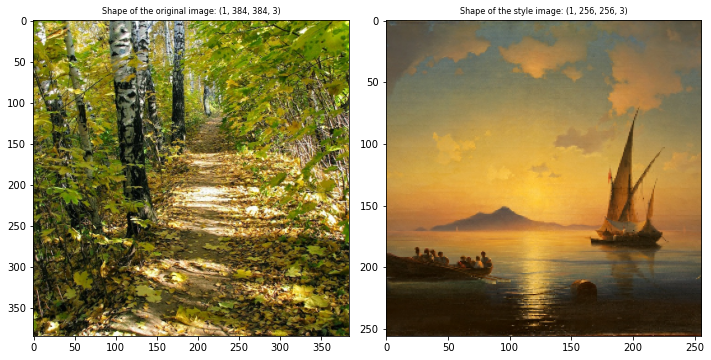

In [5]:
original,style='01_011.png','06_001.png'
original=tf.keras.utils.get_file(original,file_path+original)
style=tf.keras.utils.get_file(style,file_path+style)
original_img=load_img(original)
style_img=load_img(style)
prepro_original_img=preprocess_img(original_img,384)
prepro_style_img=preprocess_img(style_img,256)
display_images(prepro_original_img,prepro_style_img)

In [6]:
%radial_gradient_header Pre-Trained Lite Models

In [7]:
style_predict_path=tf.keras.utils.get_file(
    'style_predict.tflite',
    'https://tfhub.dev/google/lite-model/magenta/'+\
    'arbitrary-image-stylization-v1-256/'+\
    'int8/prediction/1?lite-format=tflite')
style_transform_path=tf.keras.utils.get_file(
    'style_transform.tflite',
    'https://tfhub.dev/google/lite-model/magenta/'+\
    'arbitrary-image-stylization-v1-256/'+\
    'int8/transfer/1?lite-format=tflite')

286720/284398 [==============================] - 0s 0us/step


In [8]:
def style_predict(prepro_style_img):
    interpreter=tf.lite.Interpreter(
        model_path=style_predict_path)
    interpreter.allocate_tensors()
    input_details=interpreter.get_input_details()
    interpreter.set_tensor(
        input_details[0]['index'],prepro_style_img)
    interpreter.invoke()
    style_bottleneck=interpreter.tensor(
        interpreter.get_output_details()[0]['index'])()
    return style_bottleneck
style_bottleneck=style_predict(prepro_style_img)
print('Style Bottleneck Shape:',style_bottleneck.shape)

Style Bottleneck Shape: (1, 1, 1, 100)


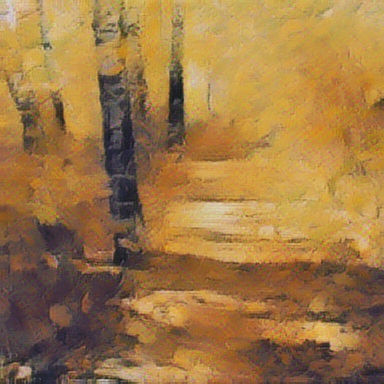

In [9]:
def style_transform(style_bottleneck,prepro_original_img):
    interpreter=tf.lite.Interpreter(
        model_path=style_transform_path)
    input_details=interpreter.get_input_details()
    interpreter.allocate_tensors()
    interpreter.set_tensor(
        input_details[0]['index'],prepro_original_img)
    interpreter.set_tensor(
        input_details[1]['index'],style_bottleneck)
    interpreter.invoke()
    stylized_img=interpreter.tensor(
        interpreter.get_output_details()[0]['index'])()
    return stylized_img
stylized_img=style_transform(
    style_bottleneck,prepro_original_img)
tensor2img(stylized_img)

In [10]:
%radial_gradient_header Style Blending

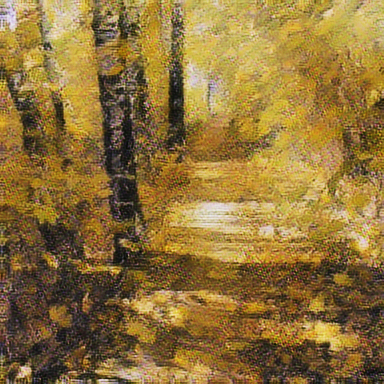

In [11]:
style_bottleneck_original=style_predict(
    preprocess_img(original_img,256))
original_blending_ratio=.5
style_bottleneck_blended=\
original_blending_ratio*style_bottleneck_original+\
(1-original_blending_ratio)*style_bottleneck
stylized_img_blended=style_transform(
    style_bottleneck_blended,prepro_original_img)
tensor2img(stylized_img_blended)

In [12]:
%radial_gradient_header Style Original Interpolation

In [13]:
def interpolate_hypersphere(v1,v2,steps):
    v1norm=np.linalg.norm(v1)
    v2norm=np.linalg.norm(v2)
    v2normalized=v2*(v1norm/v2norm)
    vectors=[]
    for step in range(steps):
        interpolated=v1+(v2normalized-v1)*step/(steps-int(1))
        interpolated_norm=np.linalg.norm(interpolated)
        interpolated_normalized=\
        interpolated*(v1norm/interpolated_norm)
        vectors.append(interpolated_normalized)
    return np.array(vectors)
prepro_style_img=preprocess_img(style_img,384)
steps=30
imgs=np.vstack(
    [interpolate_hypersphere(
        np.squeeze(prepro_original_img),
        np.squeeze(prepro_style_img),steps),
     interpolate_hypersphere(
         np.squeeze(prepro_style_img),
         np.squeeze(prepro_original_img),2*steps)])

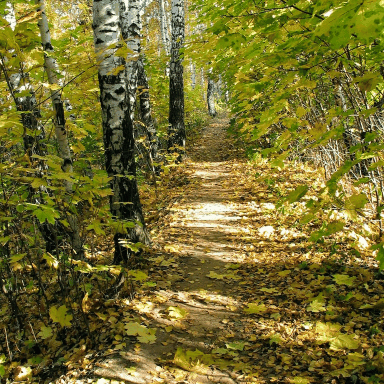

In [14]:
file_name='pic.gif'
imgs=imgs*255
imgs=np.array(imgs,dtype=np.uint8)
imageio.mimsave(file_name,imgs)
Image(open('pic.gif','rb').read())